In [1]:
#Importing all libraries used in lessons covering this project; just in case I need any of them 
import os
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import glob
import pickle

# Camera Calibration - Compute Calibration Matrix and Distortion Matrix

In [2]:
#Compute Calibration & Distortion Matricies and Coefficients and return them
cal_images_names = glob.glob('camera_cal/*')
cal_images = []
for name in cal_images_names:
    cal_images.append(mpimg.imread(name))
nx = 9
ny = 6
img_size = (cal_images[0].shape[1], cal_images[0].shape[0])

In [3]:
def calibrate(direc, output):
    #to save images with drawn corners and lines'
    if not os.path.exists(output):
        os.makedirs(output)
    names = os.listdir(direc)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(direc+'*')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            #write_name = 'corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            plt.figure()
            plt.imshow(img)
            mpimg.imsave(output+names[idx], img)
            cv2.waitKey(500)

    cv2.destroyAllWindows()
    
    return objpoints, imgpoints

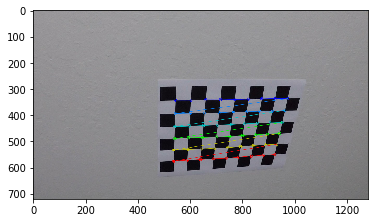

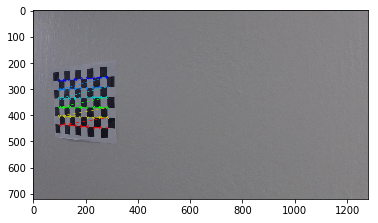

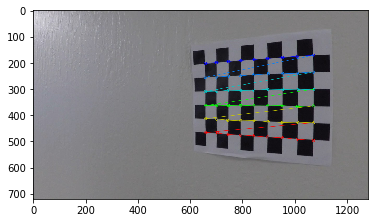

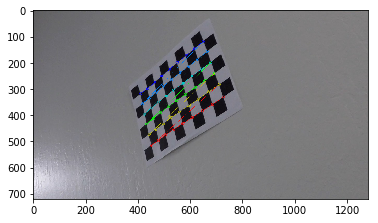

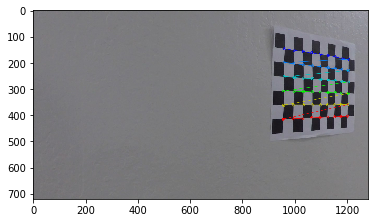

...

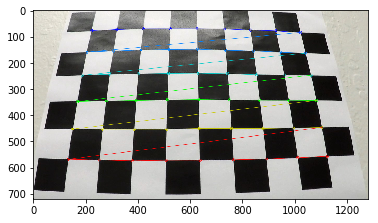

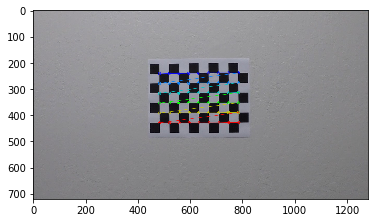

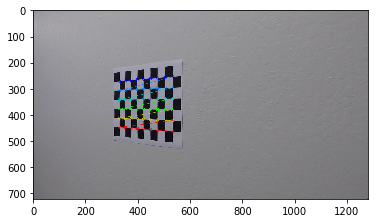

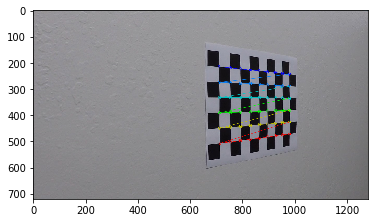

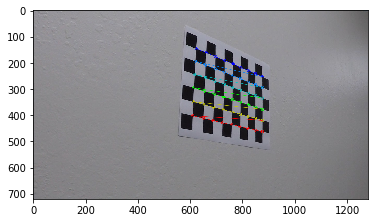

In [4]:
#run the function
objpoints, imgpoints = calibrate('camera_cal/', 'RGB-Convolution/camera_cal-output/')
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Apply undistortion - Save output to undistort-output

In [5]:
#takes output from previous function to undistort images
def undistort(fname, ret, mtx, dist):
    # Step through the list and search for chessboard corners
    img = mpimg.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    plt.figure()
    plt.imshow(dst)
    return dst

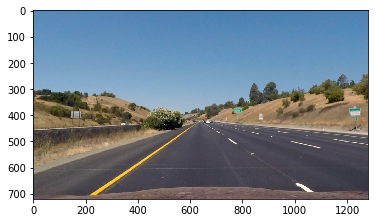

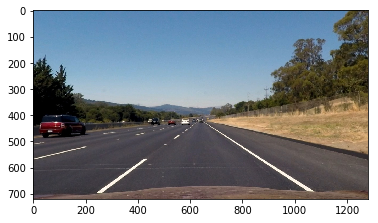

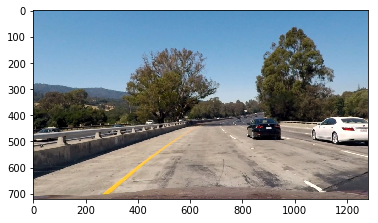

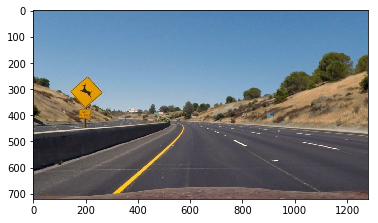

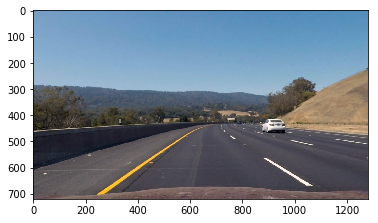

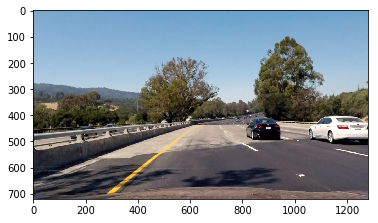

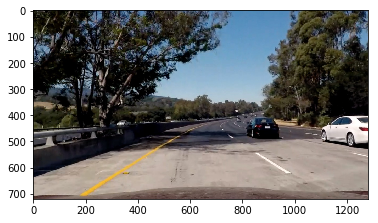

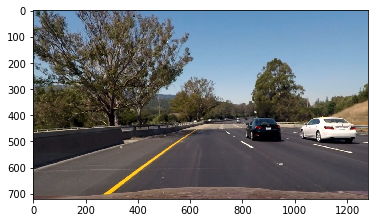

In [6]:
images = glob.glob('test_images/*')
names = os.listdir('test_images/')
im_size = (mpimg.imread(images[0]).shape[1], mpimg.imread(images[0]).shape[0])
if not os.path.exists('RGB-Convolution/undistort-output/'):
    os.makedirs('RGB-Convolution/undistort-output/')
for indx, fname in enumerate(images):
    dst = undistort(fname, ret, mtx, dist)
    mpimg.imsave('RGB-Convolution/undistort-output/'+names[indx], dst)

# We only Work on R channel and G channel; Gradient ( Derivative/Magnitude/Direction ) threshold and  to make binary image - Save output to binary-output

In [7]:
#I tried to use HLS, picking thresholded L and S channels then applying Derivative, Magnitude and Direction, but it didn't
#it did not give good results, thus I made use of the pipeline provided in the lessons

#there will be output images of my own pipeline in the output folder hls-output of which I will provide in the zipped file

In [8]:
def RGB_gradient(img, R_thresh=(230, 255), gx_thresh=(30, 80)):
    # 1) Convert to HLS color space

    R = image[:,:,0]
    G = image[:,:,1]
    B = image[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(G, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    gxbinary = np.zeros_like(scaled_sobel)
    gxbinary[(scaled_sobel >= gx_thresh[0]) & (scaled_sobel <= gx_thresh[1])] = 1
    
    # Threshold color channel
    R_binary = np.zeros_like(R)
    R_binary[(R >= R_thresh[0]) & (R <= R_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(gxbinary), gxbinary, R_binary)) * 255
    return gxbinary, R_binary, color_binary

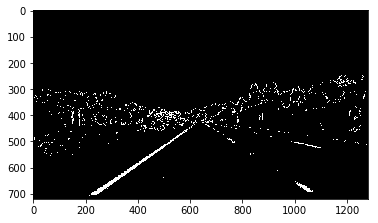

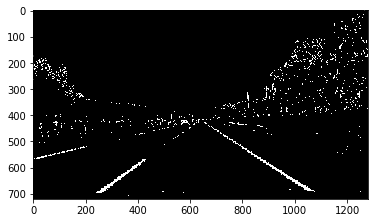

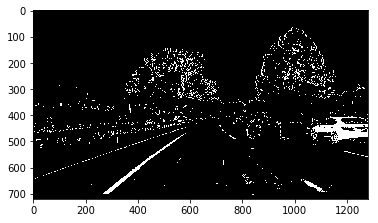

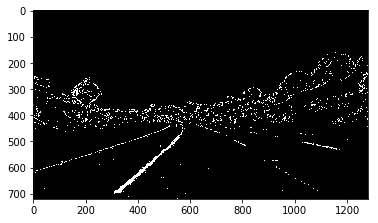

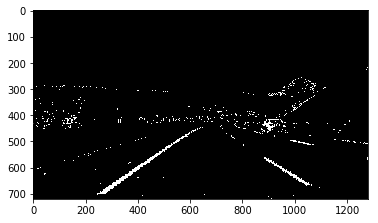

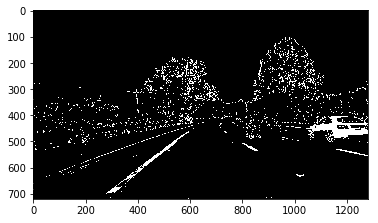

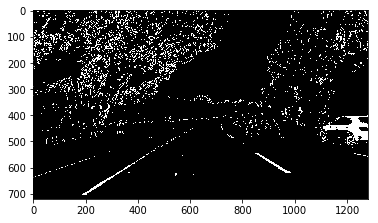

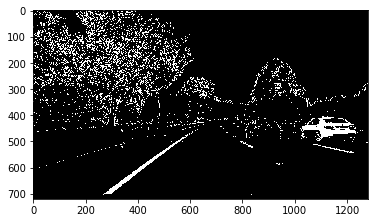

In [9]:
images = glob.glob('RGB-Convolution/undistort-output/*')
names = os.listdir('test_images/')
if not os.path.exists('RGB-Convolution/RGB_gradient-output/'):
    os.makedirs('RGB-Convolution/RGB_gradient-output/')
for indx, fname in enumerate(images):
    image = mpimg.imread(fname)
    gxbinary, R_binary, result = RGB_gradient(image)
    combined = np.zeros_like(gxbinary)
    combined[(gxbinary == 1) | (R_binary == 1)] = 1
    plt.figure()
    plt.imshow(combined, cmap='gray')
    mpimg.imsave('RGB-Convolution/RGB_gradient-output/'+names[indx], combined)

#  Apply Bird-Eye-View - Save output to bird-output

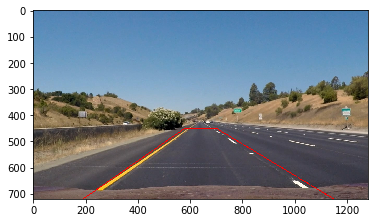

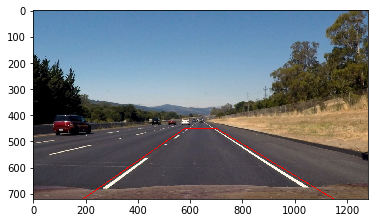

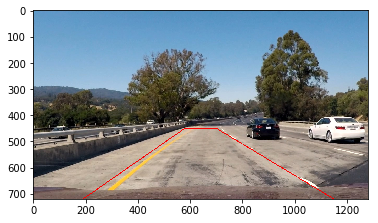

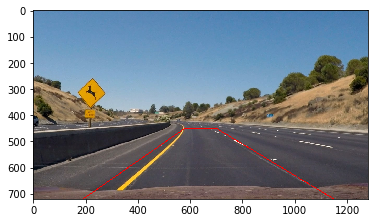

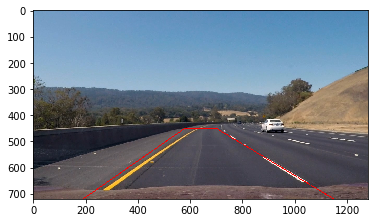

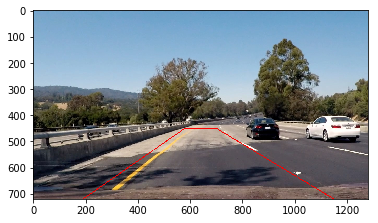

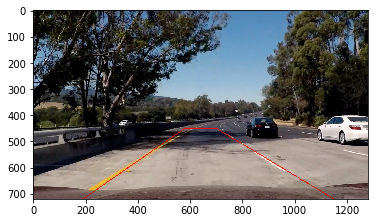

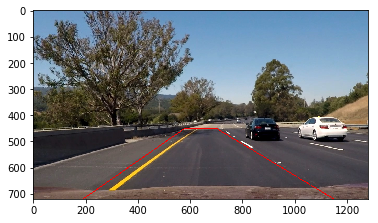

In [10]:
images = glob.glob('test_images/*')
names = os.listdir('test_images/')
if not os.path.exists('RGB-Convolution/test_images_region-output/'):
    os.makedirs('RGB-Convolution/test_images_region-output/')
for indx, fname in enumerate(images):
    test_image = mpimg.imread(fname)
    left_bot = (190, 720)
    left_botx, left_boty = left_bot
    left_top = (580, 450)
    left_topx, left_topy = left_top
    right_top = (700,450)
    right_topx, right_topy = right_top
    right_bot = (1150,720)
    right_botx, right_boty = right_bot
    cv2.line(test_image, left_bot, left_top, [255, 0, 0], 2)
    cv2.line(test_image, left_top, right_top, [255, 0, 0], 2)
    cv2.line(test_image, right_bot, right_top, [255, 0, 0], 2)
    cv2.line(test_image, right_bot, left_bot, [255, 0, 0], 2)
    mpimg.imsave('RGB-Convolution/test_images_region-output/'+names[indx], test_image)
    plt.figure()
    plt.imshow(test_image)

In [11]:
#objpoints, imgpoints = calibrate('test_images/', 'test_images_cali-output/')
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, im_size, None, None)

In [12]:
def bird(img,nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    #gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    # Search for corners in the grayscaled image
    left_bot = (190, 720)
    left_botx, left_boty = left_bot
    left_top = (580, 450)
    left_topx, left_topy = left_top
    right_top = (700,450)
    right_topx, right_topy = right_top
    right_bot = (1150,720)
    right_botx, right_boty = right_bot
    right_botx, right_boty = right_bot

    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 300 # offset for dst points
    # Grab the image shape
    img_size = (undist.shape[1], undist.shape[0])

        # For source points I'm grabbing the outer four detected corners
    src = np.float32([[left_topx, left_topy], [right_topx, right_topy], [right_botx, right_boty], [left_botx, left_boty]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]],
                      [offset, img_size[1]]])
        # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_Reverse = cv2.getPerspectiveTransform(dst, src)
        # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    # Return the resulting image and matrix
    return warped, M, M_Reverse

# This block of code was modified once to save bird view of non-binary images, then wrote the original code we need.

In [13]:
#I run it once here, to store the M_Reverse
top_down, perspective_M, M_Reverse  = bird(combined, nx, ny, mtx, dist)

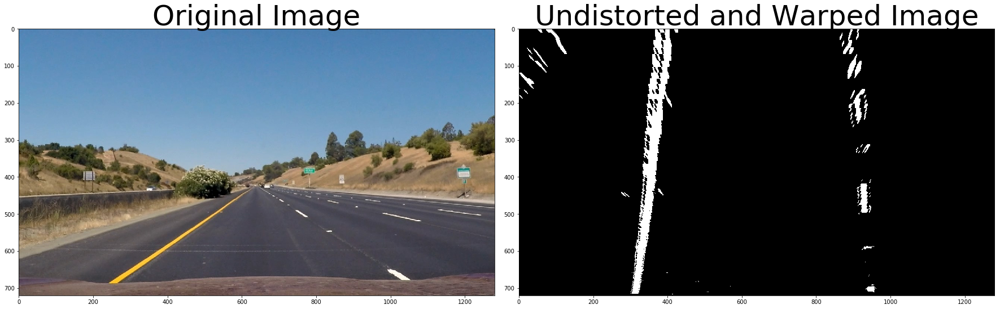

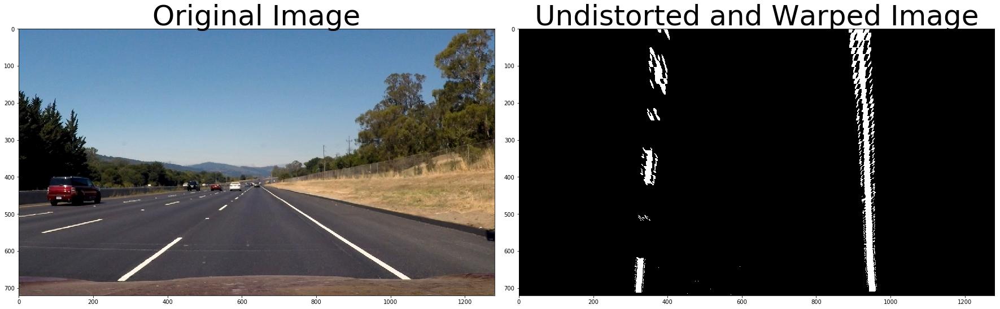

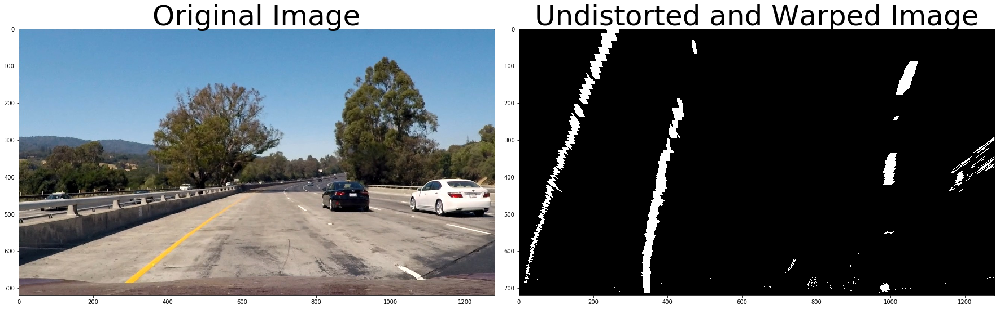

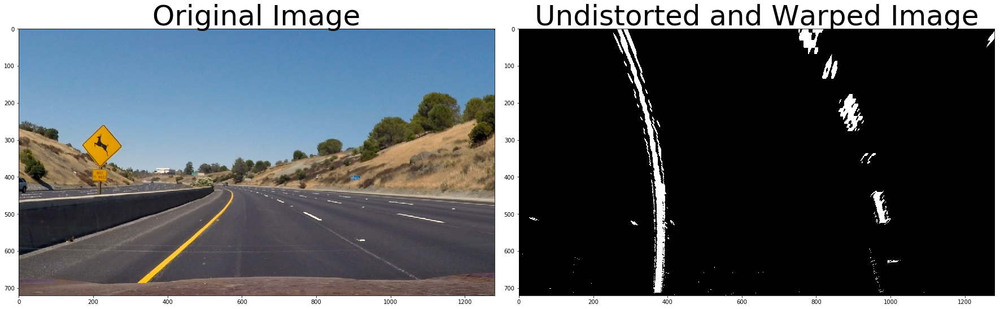

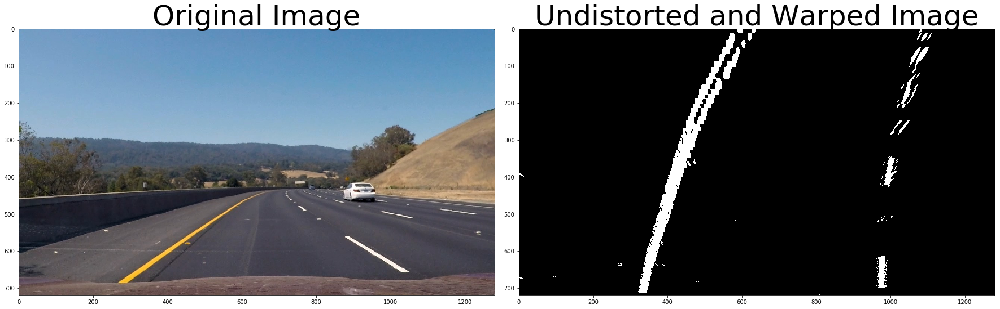

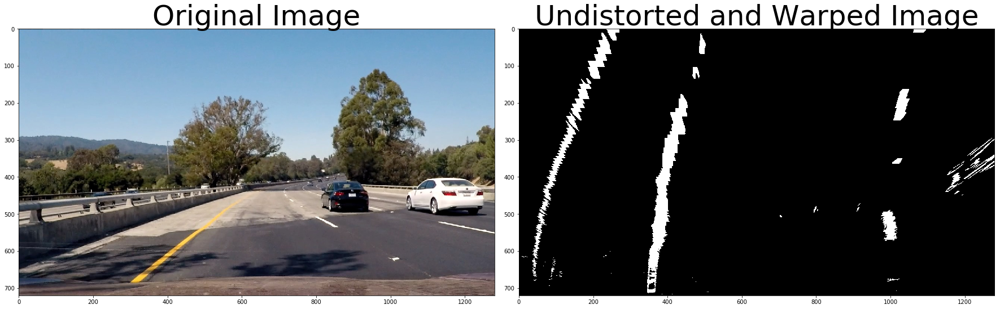

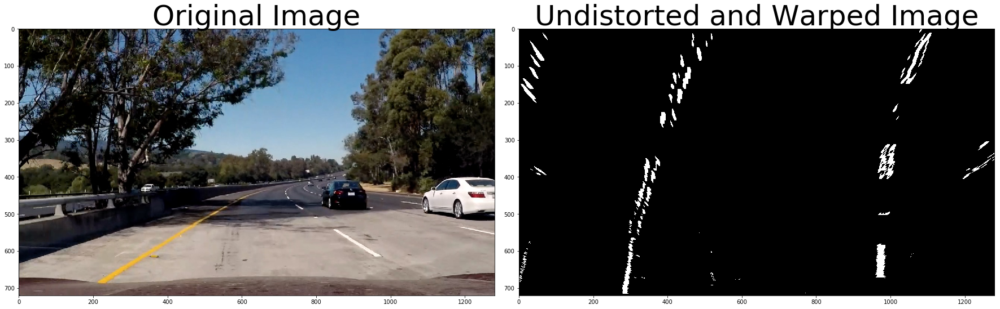

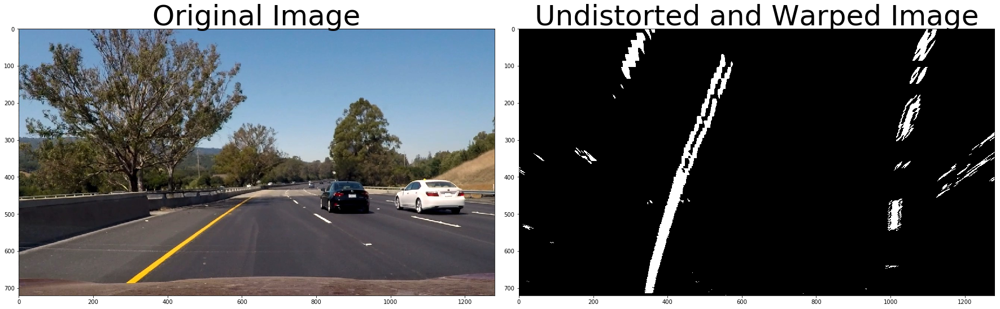

In [14]:
images = glob.glob('test_images/*')
names = os.listdir('test_images/')
if not os.path.exists('RGB-Convolution/test_images_binary-bird-output/'):
    os.makedirs('RGB-Convolution/test_images_binary-bird-output/')
for indx, fname in enumerate(images):
    image = mpimg.imread(fname)
    gxbinary, R_binary, result = RGB_gradient(image)
    combined = np.zeros_like(gxbinary)
    combined[(gxbinary == 1) | (R_binary == 1)] = 1
    top_down, perspective_M, M_Reverse  = bird(combined, nx, ny, mtx, dist)
    mpimg.imsave('RGB-Convolution/test_images_binary-bird-output/'+names[indx], top_down)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(mpimg.imread(fname), cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Detect lane Pixel, Apply Sliding Window and Polyfit - Save output to detect-output

In [15]:
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 40 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    left_points = []
    right_points = []
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    left_points.append(l_center)
    right_points.append(r_center)
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
    # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
        left_points.append(l_center)
        right_points.append(r_center)
    return window_centroids, left_points, right_points

# Calculate Curvature Radius 

In [16]:
#unlike in the sliding window approach, here we have to define ploty, because it is not actually used in the convolution approach
#the y-values of image is from 0 to 720, we give it as 720
#the convolution approach divides it into 9 samples, thus we give third paramater 9; we want to work on a space that is just like real image
ploty = np.linspace(0, 720, 9)
np.max(ploty)

720.0

In [17]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [18]:
def calculate_curvature(left_points, right_points):
    
    y_eval = np.max(ploty)
    
    left_points = np.array(left_points[::-1])  # Reverse to match top-to-bottom in y
    right_points = np.array(right_points[::-1])  # Reverse to match top-to-bottom in y
    
    # Fit a second order polynomial
    left_fit = np.polyfit(ploty, left_points, 2)
    right_fit = np.polyfit(ploty, right_points, 2)
    
    # Generate x and y values for plotting
    left_fit_ = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    right_fit_ = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    
    position = (right_fit_+left_fit_)/2
    center = 600

    # Fit new polynomials for world space
    left_fit_rw = np.polyfit(ploty*ym_per_pix, left_points*xm_per_pix, 2)
    right_fit_rw = np.polyfit(ploty*ym_per_pix, right_points*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_rw[0]*y_eval*ym_per_pix + left_fit_rw[1])**2)**1.5) / np.absolute(2*left_fit_rw[0])
    right_curverad = ((1 + (2*right_fit_rw[0]*y_eval*ym_per_pix + right_fit_rw[1])**2)**1.5) / np.absolute(2*right_fit_rw[0])

    return left_curverad, right_curverad, position, center

# Apply our functions; Convolution and Curvature Calculation

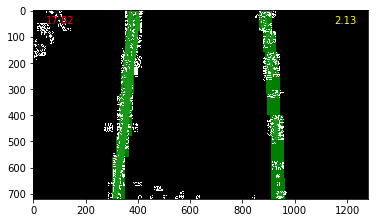

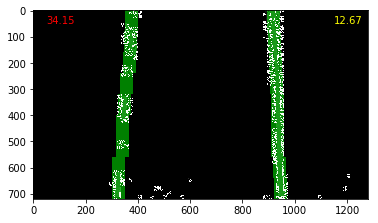

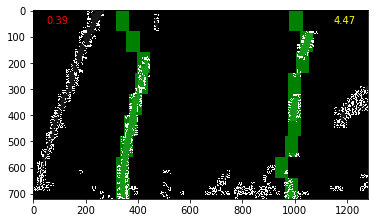

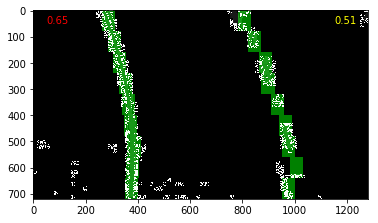

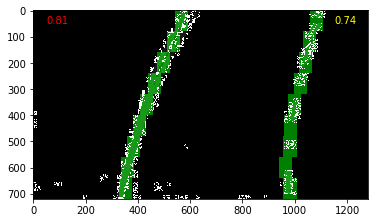

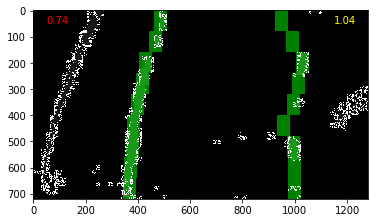

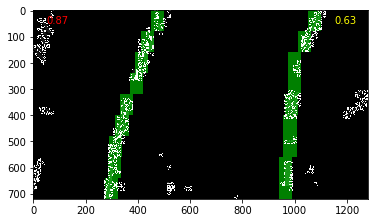

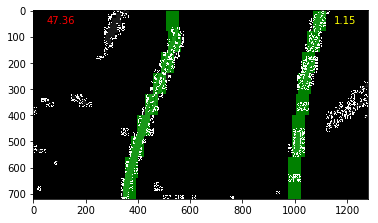

<Figure size 432x288 with 0 Axes>

In [19]:
images = glob.glob('RGB-Convolution/test_images_binary-bird-output/*')
names = os.listdir('RGB-Convolution/test_images_binary-bird-output/')
if not os.path.exists('RGB-Convolution/test_images_poly-output/'):
    os.makedirs('RGB-Convolution/test_images_poly-output/')
for indx, fname in enumerate(images):
    image = mpimg.imread(fname)
    image = cv2.cvtColor(image, cv2.COLOR_HLS2RGB)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    window_centroids, left_points, right_points = find_window_centroids(image, window_width, window_height, margin)
    left_curverad, right_curverad, position, center = calculate_curvature(left_points, right_points)
    
# Now our radius of curvature is in meters

# If we found any window centers
    if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
        l_points = np.zeros_like(image)
        r_points = np.zeros_like(image)

    # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,image,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,image,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((image, image, image))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((image,image,image)),np.uint8)
    mpimg.imsave('RGB-Convolution/test_images_poly-output/'+names[indx], output)
    plt.imshow(output)
    plt.text(50, 50, np.round(left_curverad/1000, 2), color='red')
    plt.text(1150, 50, np.round(right_curverad/1000, 2), color='yellow')
    #plt.ylabel(left_curverad/1000)
    #plt.xlabel(right_curverad/1000)
    plt.figure()

# Warp back to image - Save output to warp-ouput

# Output Curvature Radius and Other info on images - Save output to image-output